In [28]:
# Import Libraries
from keras_facenet import FaceNet
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Model
from datasets import Dataset, load_dataset, load_from_disk
import tensorflow as tf
from PIL import Image
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, roc_auc_score, confusion_matrix
import matplotlib.pyplot as plt
from PIL import Image as PILImage
from PIL import ImageEnhance, ImageFilter, ImageOps
from datasets import load_dataset, Dataset, ClassLabel, Features, Image, concatenate_datasets, Value
from tqdm import tqdm
import random
from tensorflow.keras.models import load_model
import math

In [55]:
# Load in Datasets
not_us = load_dataset("Not_Us")
jennas = load_dataset("Unseen_Us/Jenna")
ramzis = load_dataset("Unseen_Us/Ramzi")
hrishis = load_dataset("Unseen_Us/Hrishi")
carsons = load_dataset("Unseen_Us/Carson")

Resolving data files:   0%|          | 0/53 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

In [9]:
def build_model():
    embedder = FaceNet()
    base_model = embedder.model
    x = base_model.output
    classification_output = Dense(1, activation='sigmoid', name='classification_layer')(x)
    model = Model(inputs=base_model.input, outputs=classification_output)
    return model

In [10]:
# Build a fresh copy of the architecture for each person
Jenna_model = build_model()
Ramzi_model = build_model()
Hrishi_model = build_model()
Carson_model = build_model()

In [11]:
# Load each set of weights into its own model
Jenna_model.load_weights("FaceNet_2.h5")
Ramzi_model.load_weights("FaceNet_3.h5")
Hrishi_model.load_weights("FaceNet_4.h5")
Carson_model.load_weights("FaceNet_5.h5")

In [36]:
def show_incorrect_positives(model, dataset, threshold=0.85):
    incorrect_images = []

    # 1) Loop through dataset, collect false-positive images
    for example in dataset["train"]:
        img = example["image"]

        # Resize and expand dims => (1, 224, 224, 3)
        img_resized = img.resize((224, 224))
        img_array = np.array(img_resized)
        img_array = np.expand_dims(img_array, axis=0)

        # Silence the progress bar by using verbose=0
        prediction = model.predict(img_array, verbose=0)
        predicted_class = (prediction > threshold).astype(int)  # 0 or 1

        # If predicted class == 1 when label is 0 => false positive
        if predicted_class[0][0] == 1:
            incorrect_images.append(img)

    # 2) If no false positives, just print a message and return
    total = len(incorrect_images)
    if total == 0:
        print(f"No false positives found (threshold={threshold}).")
        return

    # 3) Dynamically determine rows, cols to form a near-square
    cols = int(math.ceil(math.sqrt(total)))
    rows = int(math.ceil(total / cols))

    # 4) Create a figure with subplots for all false-positive images
    fig = plt.figure(figsize=(cols * 4, rows * 4))

    for i, false_img in enumerate(incorrect_images, start=1):
        ax = fig.add_subplot(rows, cols, i)
        ax.imshow(false_img)
        ax.axis("off")
        ax.set_title(f"False Positive #{i}")

    plt.suptitle(f"Incorrectly Predicted 1 (threshold={threshold})", fontsize=16)
    plt.tight_layout()
    plt.show()


In [62]:
def show_incorrect_negatives(model, dataset, threshold=0.85):
    incorrect_images = []

    # 1) Loop through dataset, collect false-negative images
    for example in dataset["train"]:
        img = example["image"]

        # Resize and expand dims => (1, 224, 224, 3)
        img_resized = img.resize((224, 224))
        img_array = np.array(img_resized)
        img_array = np.expand_dims(img_array, axis=0)

        # Silence the progress bar by using verbose=0
        prediction = model.predict(img_array, verbose=0)
        predicted_class = (prediction > threshold).astype(int)  # 0 or 1

        # If predicted_class == 0 when label is 1 => false negative
        if predicted_class[0][0] == 0:
            incorrect_images.append(img)

    # 2) If no false negatives, just print a message and return
    total = len(incorrect_images)
    if total == 0:
        print(f"No false negatives found (threshold={threshold}).")
        return

    # 3) Dynamically determine rows, cols to form a near-square
    cols = int(math.ceil(math.sqrt(total)))
    rows = int(math.ceil(total / cols))

    # 4) Create a figure with subplots for all false-negative images
    fig = plt.figure(figsize=(cols * 4, rows * 4))

    for i, false_img in enumerate(incorrect_images, start=1):
        ax = fig.add_subplot(rows, cols, i)
        ax.imshow(false_img)
        ax.axis("off")
        ax.set_title(f"False Negative #{i}")

    plt.suptitle(f"Incorrectly Predicted 0 (threshold={threshold})", fontsize=16)
    plt.tight_layout()
    plt.show()



Jenna's Model


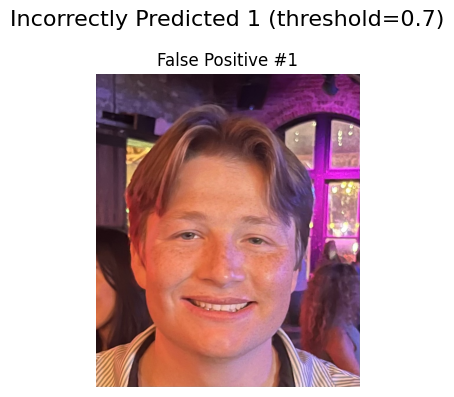


Ramzi's Model


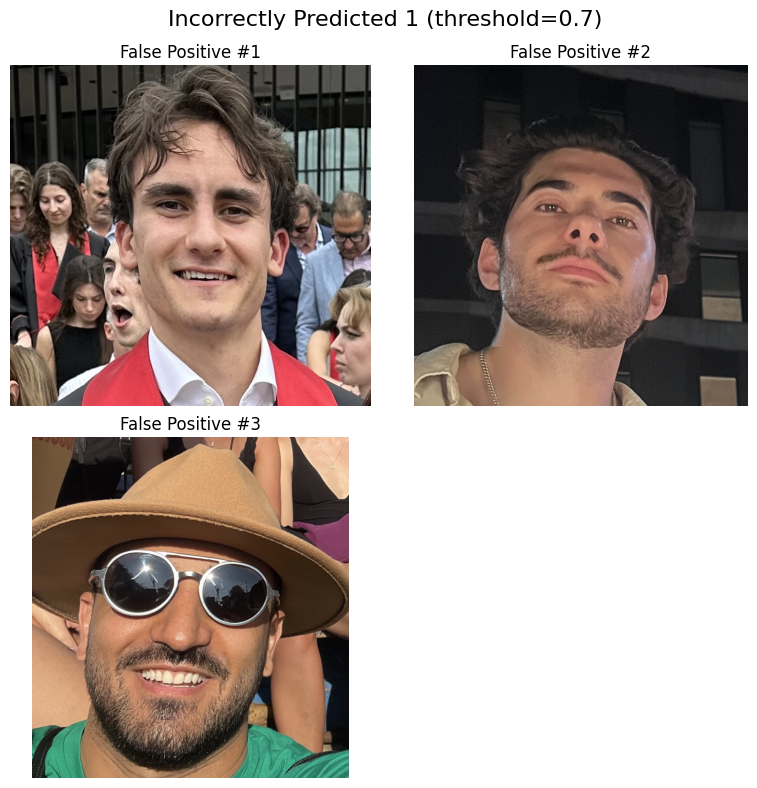


Hrishi's Model


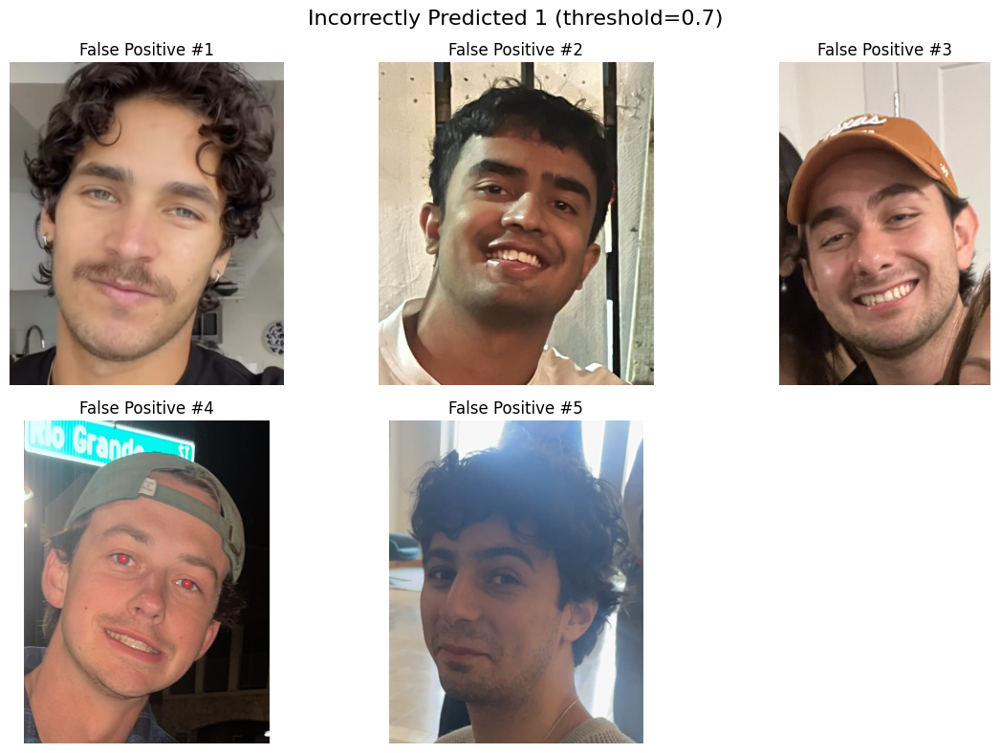


Carson's Model


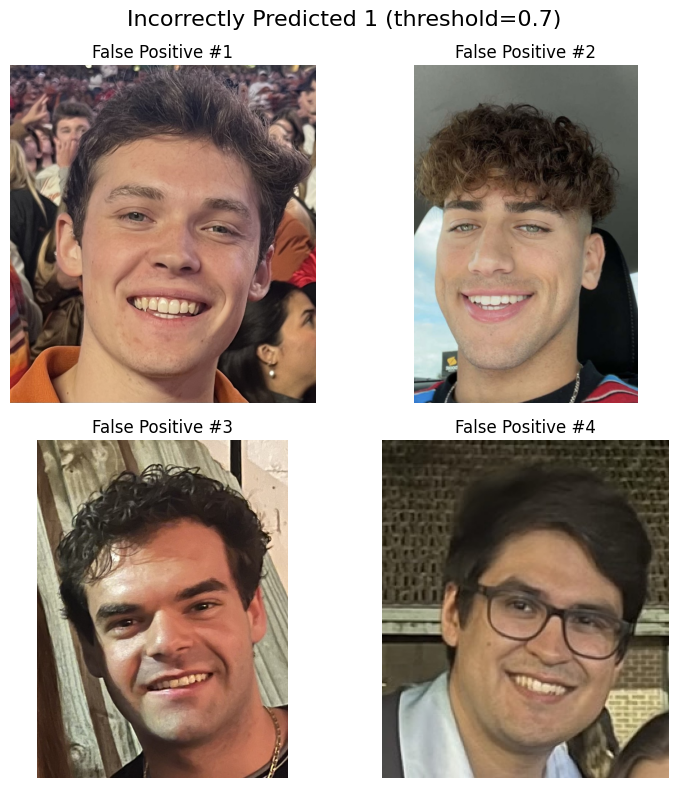

In [46]:
# Thresholds = 0.7
thresh = 0.7
print("\nJenna's Model")
show_incorrect_positives(Jenna_model, not_us, threshold=thresh)
print("\nRamzi's Model")
show_incorrect_positives(Ramzi_model, not_us, threshold=thresh)
print("\nHrishi's Model")
show_incorrect_positives(Hrishi_model, not_us, threshold=thresh)
print("\nCarson's Model")
show_incorrect_positives(Carson_model, not_us, threshold=thresh)


Jenna's Model
No false positives found (threshold=0.8).

Ramzi's Model


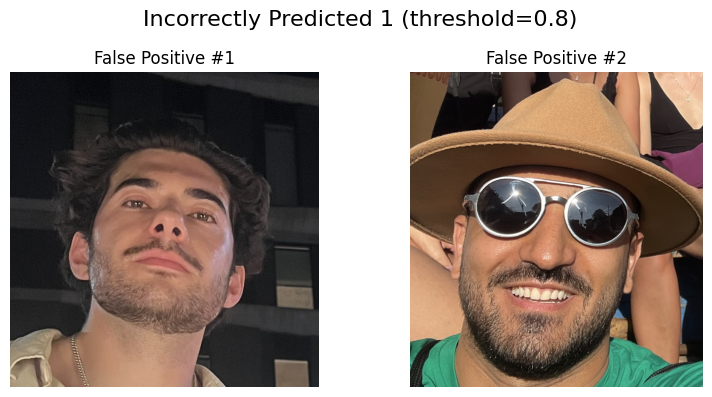


Hrishi's Model


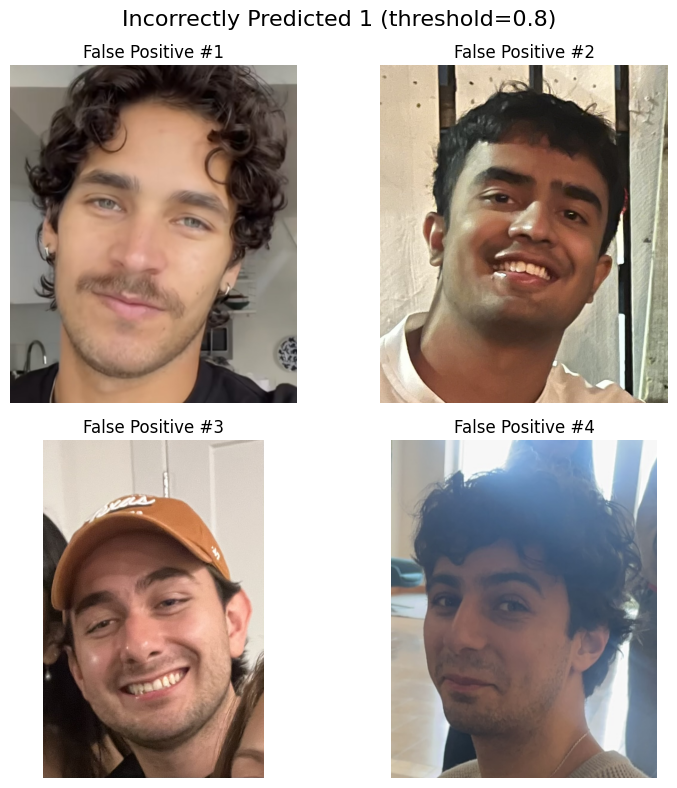


Carson's Model


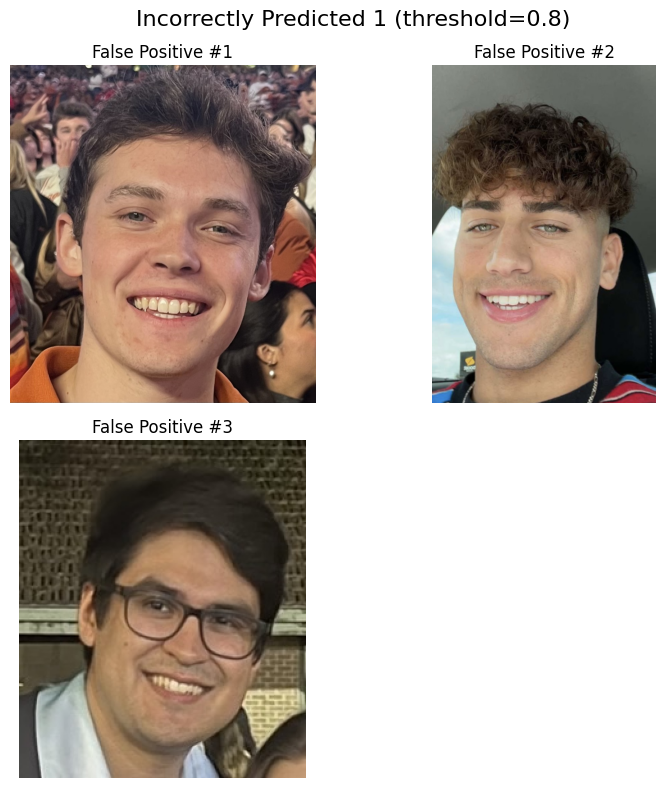

In [ ]:
# Thresholds = 0.8
thresh = 0.8
print("\nJenna's Model")
show_incorrect_positives(Jenna_model, not_us, threshold=thresh)
print("\nRamzi's Model")
show_incorrect_positives(Ramzi_model, not_us, threshold=thresh)
print("\nHrishi's Model")
show_incorrect_positives(Hrishi_model, not_us, threshold=thresh)
print("\nCarson's Model")
show_incorrect_positives(Carson_model, not_us, threshold=thresh)


Jenna's Model
No false positives found (threshold=0.9).

Ramzi's Model
No false positives found (threshold=0.9).

Hrishi's Model
No false positives found (threshold=0.9).

Carson's Model


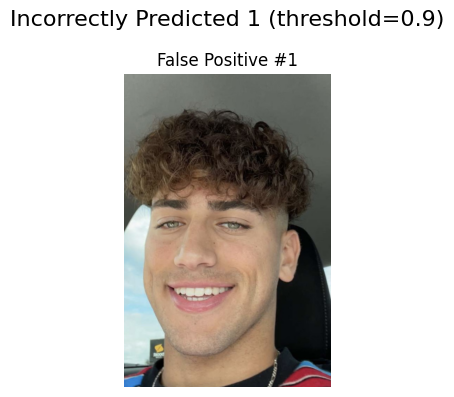

In [61]:
# Thresholds = 0.9
thresh = 0.9
print("\nJenna's Model")
show_incorrect_positives(Jenna_model, not_us, threshold=thresh)
print("\nRamzi's Model")
show_incorrect_positives(Ramzi_model, not_us, threshold=thresh)
print("\nHrishi's Model")
show_incorrect_positives(Hrishi_model, not_us, threshold=thresh)
print("\nCarson's Model")
show_incorrect_positives(Carson_model, not_us, threshold=thresh)

In [ ]:
# Thresholds = 0.95
thresh = 0.95
print("\nJenna's Model")
show_incorrect_positives(Jenna_model, not_us, threshold=thresh)
print("\nRamzi's Model")
show_incorrect_positives(Ramzi_model, not_us, threshold=thresh)
print("\nHrishi's Model")
show_incorrect_positives(Hrishi_model, not_us, threshold=thresh)
print("\nCarson's Model")
show_incorrect_positives(Carson_model, not_us, threshold=thresh)


Jenna's Model
No false positives found (threshold=0.95).

Ramzi's Model
No false positives found (threshold=0.95).

Hrishi's Model
No false positives found (threshold=0.95).

Carson's Model
No false positives found (threshold=0.95).


In [64]:
# Thresholds = 0.7
thresh = 0.7
print("\nJenna's Model")
show_incorrect_negatives(Jenna_model, jennas, threshold=thresh)
print("\nRamzi's Model")
show_incorrect_negatives(Ramzi_model, ramzis, threshold=thresh)
print("\nHrishi's Model")
show_incorrect_negatives(Hrishi_model, hrishis, threshold=thresh)
print("\nCarson's Model")
show_incorrect_negatives(Carson_model, carsons, threshold=thresh)


Jenna's Model
No false negatives found (threshold=0.7).

Ramzi's Model
No false negatives found (threshold=0.7).

Hrishi's Model
No false negatives found (threshold=0.7).

Carson's Model
No false negatives found (threshold=0.7).



Jenna's Model


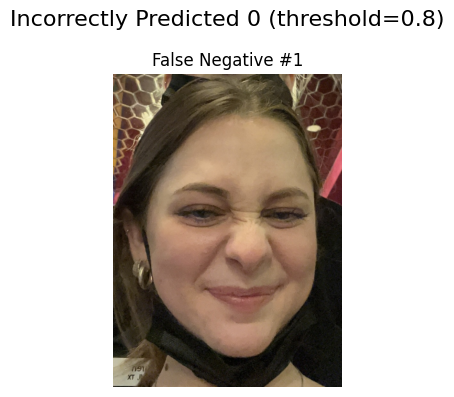


Ramzi's Model
No false negatives found (threshold=0.8).

Hrishi's Model
No false negatives found (threshold=0.8).

Carson's Model
No false negatives found (threshold=0.8).


In [65]:
# Thresholds = 0.7
thresh = 0.8
print("\nJenna's Model")
show_incorrect_negatives(Jenna_model, jennas, threshold=thresh)
print("\nRamzi's Model")
show_incorrect_negatives(Ramzi_model, ramzis, threshold=thresh)
print("\nHrishi's Model")
show_incorrect_negatives(Hrishi_model, hrishis, threshold=thresh)
print("\nCarson's Model")
show_incorrect_negatives(Carson_model, carsons, threshold=thresh)


Jenna's Model


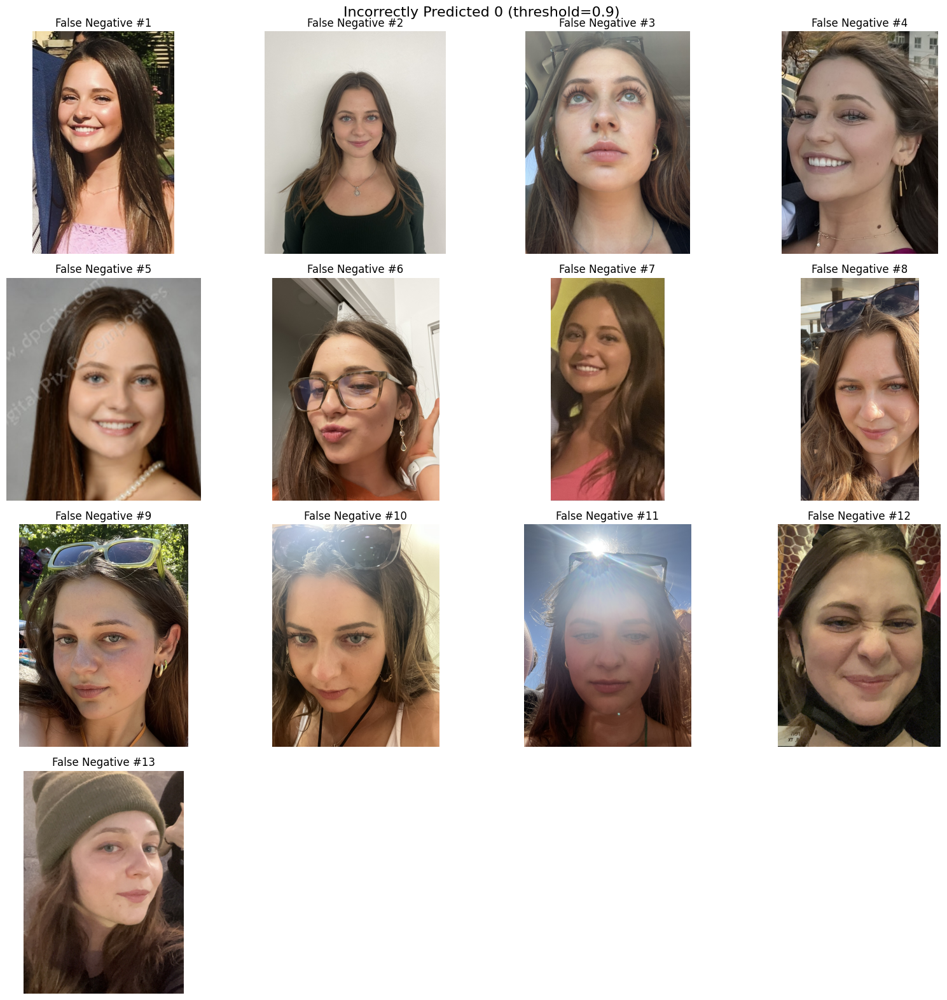


Ramzi's Model
No false negatives found (threshold=0.9).

Hrishi's Model
No false negatives found (threshold=0.9).

Carson's Model
No false negatives found (threshold=0.9).


In [66]:
# Thresholds = 0.7
thresh = 0.9
print("\nJenna's Model")
show_incorrect_negatives(Jenna_model, jennas, threshold=thresh)
print("\nRamzi's Model")
show_incorrect_negatives(Ramzi_model, ramzis, threshold=thresh)
print("\nHrishi's Model")
show_incorrect_negatives(Hrishi_model, hrishis, threshold=thresh)
print("\nCarson's Model")
show_incorrect_negatives(Carson_model, carsons, threshold=thresh)


Jenna's Model


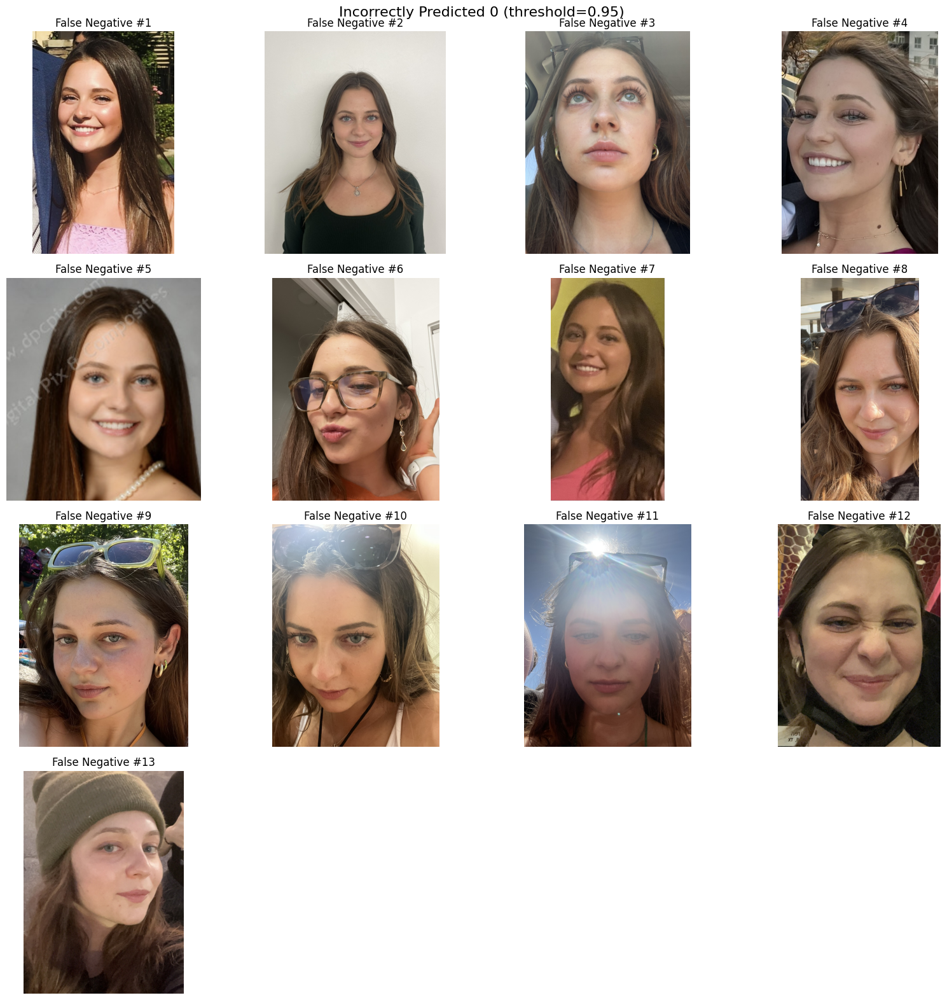


Ramzi's Model


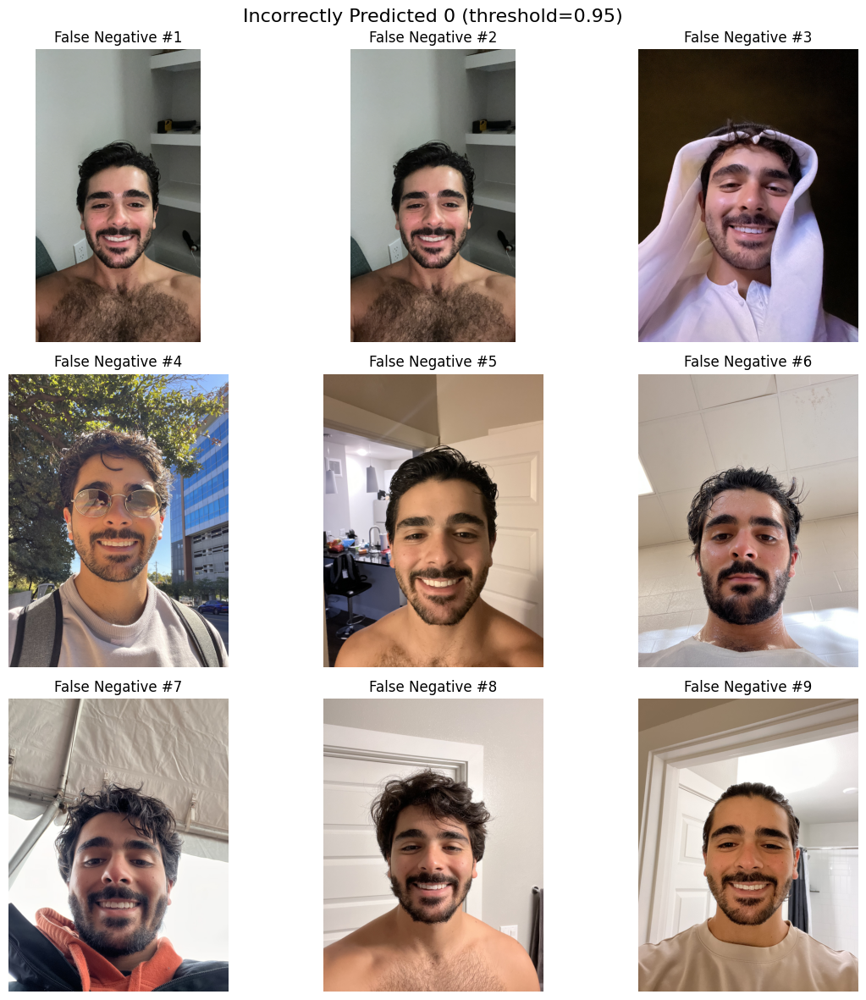


Hrishi's Model


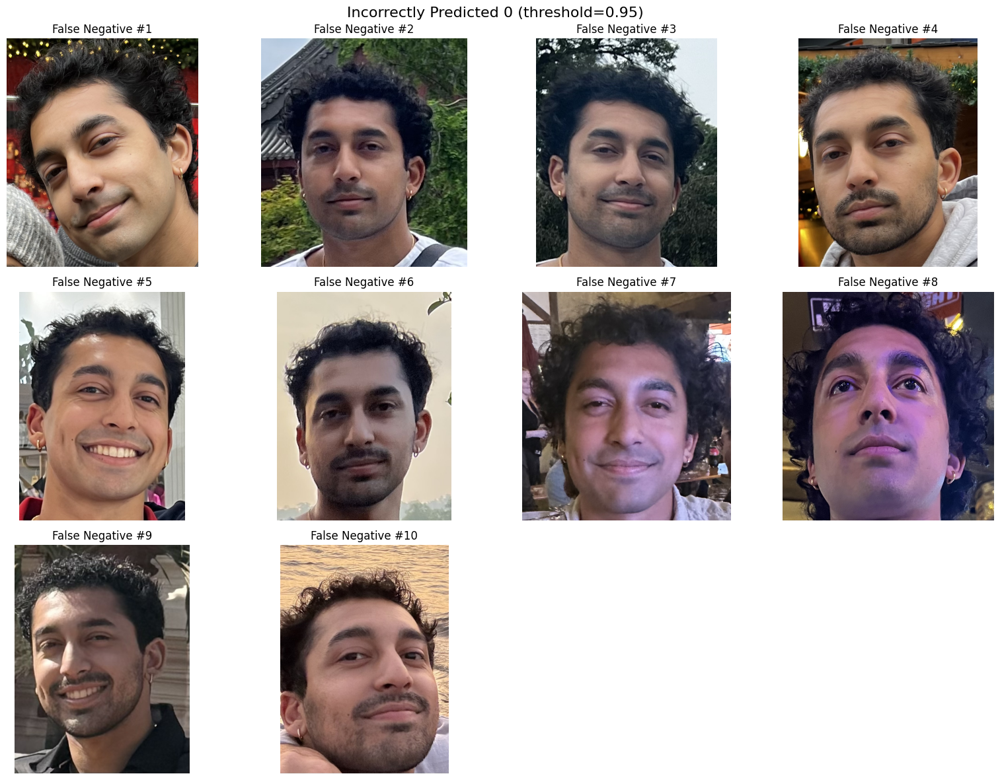


Carson's Model


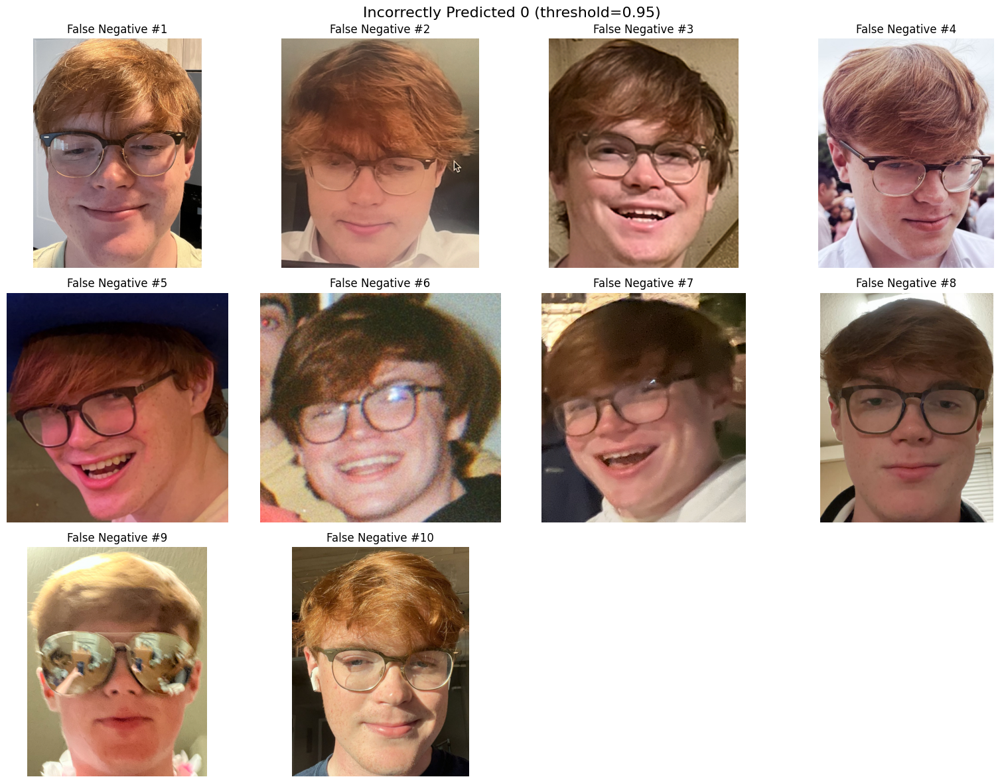

In [67]:
# Thresholds = 0.7
thresh = 0.95
print("\nJenna's Model")
show_incorrect_negatives(Jenna_model, jennas, threshold=thresh)
print("\nRamzi's Model")
show_incorrect_negatives(Ramzi_model, ramzis, threshold=thresh)
print("\nHrishi's Model")
show_incorrect_negatives(Hrishi_model, hrishis, threshold=thresh)
print("\nCarson's Model")
show_incorrect_negatives(Carson_model, carsons, threshold=thresh)